# Image bbox 확인

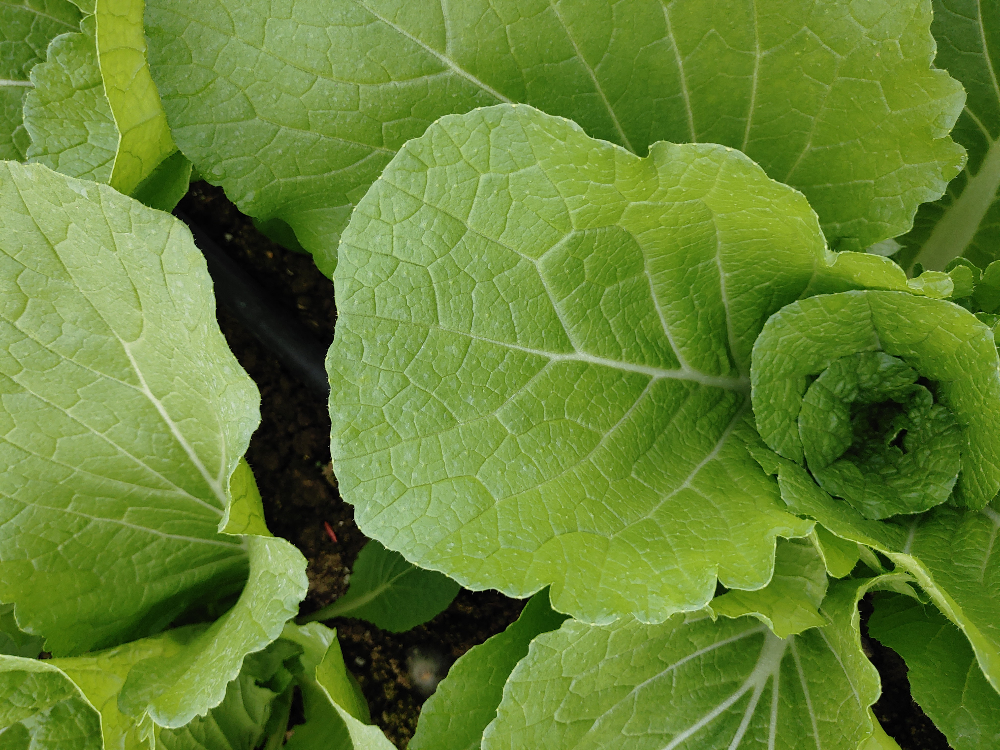

In [157]:
import pandas as pd
import json
import os
import cv2
from PIL import ImageDraw
from PIL import Image

json_file_path="/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/label_normal/"
file_list = os.listdir(json_file_path)
contents = []
for file in file_list:
    if file.endswith(".json"):
        with open(json_file_path+file,'r') as j:
            contents.append(json.loads(j.read()))
contents[0]
root = '/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/images_normal/'

#아래의 450부분이 image number, 해당부분만 수정하여 이미지 확인
#contents[image_number]...
example_img = Image.open(root+contents[450]['description']['image'])

example_bbox = contents[450]['annotations']['points']
example_bbox
x1 = example_bbox[0]['xtl']
y1 = example_bbox[0]['ytl']
x2 = example_bbox[0]['xbr']
y2 = example_bbox[0]['ybr']

draw = ImageDraw.Draw(example_img)
#draw.line([(x1, y1), (x2, y1),(x2, y2), (x1, y2),  (x1, y1)], fill="red", width=10)
example_img


# EDA 

## Train set

In [158]:
image_list = pd.read_csv("/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/annotation_filename.csv")
data_infos = []
#print(image_list)
root = "/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/label_normal/"
img_prefix = "/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/images_normal"
for file_name in image_list['0']:
    with open(root+file_name,'r') as j: #annotation 경로 추가
            dic = json.loads(j.read())

dic

{'description': {'image': 'V006_79_0_00_03_03_12_0_c32_20201117_0809_S01_1.jpg',
  'date': '2020/11/17',
  'worker': '',
  'height': 3024,
  'width': 4032,
  'task': 79,
  'type': 0,
  'region': None},
 'annotations': {'disease': 0,
  'crop': 3,
  'area': 3,
  'grow': 12,
  'risk': 0,
  'points': [{'xtl': 1349, 'ytl': 486, 'xbr': 3275, 'ybr': 2474}]}}

### Dataframe 생성

In [184]:
image_list = pd.read_csv("/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/annotation_filename.csv")
data_infos = []
img_annos= []
id=0
img_list = []
width_list = []
height_list = []
bbox_list = []
crop_list = []
isDiseases = []

for file_name in image_list['0']:
    with open("/Users/somang/Desktop/mymac/boostcamp/final_proj/dataset/Training/label_normal/"+file_name,'r') as j: #annotation 경로 추가
        dic = json.loads(j.read())
        date_captured = dic['description']['date']
        width = dic['description']['width']
        height = dic['description']['height']
        img_name = dic['description']['image']
        width_list.append(width)
        height_list.append(height)
        img_list.append(img_name)
        
        #print(dic)
        points = dic['annotations']['points']
        crop = dic['annotations']['crop']
        isDisease = dic['annotations']['disease']
        bbox_list.append(points)
        crop_list.append(crop)
        isDiseases.append(isDisease)
        #bboxes = [points[0]['xtl'],points[0]['ytl'],width,height]
data_list = {'image':img_list,'crop':crop_list,'isDisease':isDiseases,'width':width_list,'height':height_list,'bbox':bbox_list}
result = pd.DataFrame(data_list)
result

,image,crop,isDisease,width,height,bbox
0,V006_79_0_00_03_03_12_0_c31_20201030_0078_S01_...,3,0,4656,3492,"[{'xtl': 385, 'ytl': 384, 'xbr': 3747, 'ybr': ..."
1,V006_79_0_00_03_03_12_0_c32_20201117_0492_S01_...,3,0,4032,3024,"[{'xtl': 1538, 'ytl': 649, 'xbr': 3457, 'ybr':..."
2,V006_79_0_00_03_03_12_0_c32_20201117_0487_S01_...,3,0,4032,3024,"[{'xtl': 1225, 'ytl': 421, 'xbr': 3679, 'ybr':..."
3,V006_79_0_00_03_03_12_0_c31_20201109_0356_S01_...,3,0,4656,3492,"[{'xtl': 2679, 'ytl': 47, 'xbr': 3493, 'ybr': ..."
4,V006_79_0_00_03_03_12_0_c31_20201109_0343_S01_...,3,0,4656,3492,"[{'xtl': 870, 'ytl': 287, 'xbr': 4418, 'ybr': ..."
...,...,...,...,...,...,...
9313,V006_79_0_00_03_03_12_0_c31_20201109_0420_S01_...,3,0,4656,3492,"[{'xtl': 1356, 'ytl': 534, 'xbr': 4446, 'ybr':..."
9314,V006_79_0_00_03_03_12_0_c31_20201113_0149_S01_...,3,0,4656,3492,"[{'xtl': 884, 'ytl': 465, 'xbr': 4156, 'ybr': ..."
9315,V006_79_0_00_03_03_12_0_c09_20201118_0183_S01_...,3,0,4032,3024,"[{'xtl': 1049, 'ytl': 114, 'xbr': 3260, 'ybr':..."
9316,V006_79_0_00_03_03_12_0_c09_20201118_0196_S01_...,3,0,4032,3024,"[{'xtl': 611, 'ytl': 107, 'xbr': 3139, 'ybr': ..."


### 이미지개수

In [185]:
#원본이미지 개수
img_len = len(image_list['0'])
print("image 개수 :",img_len)
#dataframe 행 개수와 원본이미지 개수 동일한지 파악
if img_len == len(result):
    print("이미지 한 개당 annotation file 한 개 존재")

#crop이 3인 데이터의 개수 (작물이 배추인 데이터의 개수)
if img_len == len(result['crop']==3):
    print("모든 데이터는 배추")

#모두 정상데이터인지 확인
if img_len == len(result['isDisease']==0):
    print("모든 데이터는 정상 작물 표기")

image 개수 : 9318
이미지 한 개당 annotation file 한 개 존재
모든 데이터는 배추
모든 데이터는 정상 작물 표기


### describe data 

In [186]:
result.describe()

,crop,isDisease,width,height
count,9318.0,9318.0,9318.00000,9318.000000
mean,3.0,0.0,4075.41275,2921.644130
std,0.0,0.0,645.67638,669.672828
min,3.0,0.0,1468.00000,1212.000000
25%,3.0,0.0,4032.00000,2196.000000
50%,3.0,0.0,4032.00000,3024.000000
75%,3.0,0.0,4640.00000,3492.000000
max,3.0,0.0,6000.00000,4160.000000


### 이미지당 bbox 개수

In [187]:
isone = False
for box in result['bbox']:
    if len(box)!= 1:
        isone = False
        break
    else:
        isone = True
        pass
if isone == True:
    print("모든 이미지는 하나의 bbox를 가집니다.")
else:
    print("모든 이미지가 하나의 bbox만 가지는 것은 아닙니다.")

모든 이미지는 하나의 bbox를 가집니다.


## 이미지 크기 분포

### 이미지 width

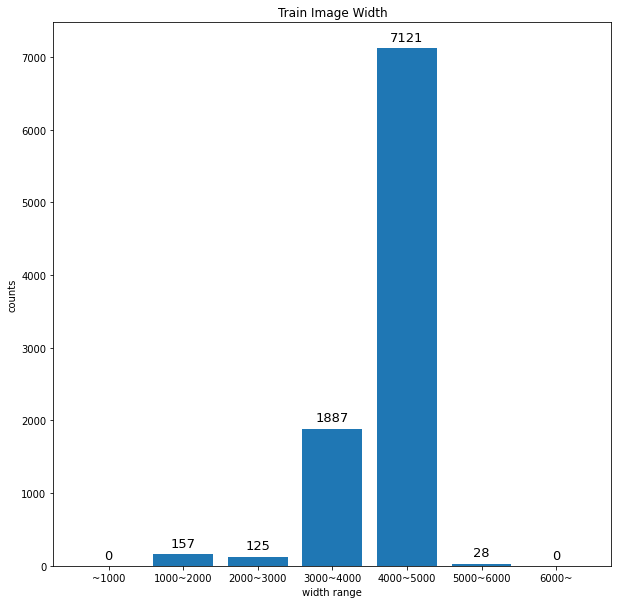

In [205]:
import matplotlib.pyplot as plt

width_range = []
wid_1 = result['width'][result['width']<=1000].count()
wid_2 = result['width'][result['width']<=2000].count() - wid_1
wid_3 = result['width'][result['width']<=3000].count() - wid_2 - wid_1
wid_4 = result['width'][result['width']<=4000].count() - wid_3 - wid_2 - wid_1
wid_5 = result['width'][result['width']<=5000].count() - wid_4 - wid_3 - wid_2 - wid_1
wid_6 = result['width'][result['width']<=6000].count() - wid_5 - wid_4 - wid_3 - wid_2 - wid_1
wid_7 = result['width'][result['width']>6000].count()
width_range = [wid_1,wid_2,wid_3,wid_4,wid_5,wid_6,wid_7]

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()

plt.title("Train Image Width")
plt.xlabel("width range")
plt.ylabel("counts")
x_bar = ["~1000","1000~2000","2000~3000","3000~4000","4000~5000","5000~6000","6000~"]
xtick_label_position = list(range(len(x_bar))) ## x축 눈금 라벨이 표시될 x좌표
plt.xticks(xtick_label_position, x_bar) ## x축 눈금 라벨 출력
 
bars = plt.bar(xtick_label_position,width_range)

for i, b in enumerate(bars):
    ax.text(b.get_x()+b.get_width()*(1/2),b.get_height()+100, \
            width_range[i],ha='center',fontsize=13)

plt.show()

### 이미지 height

9318


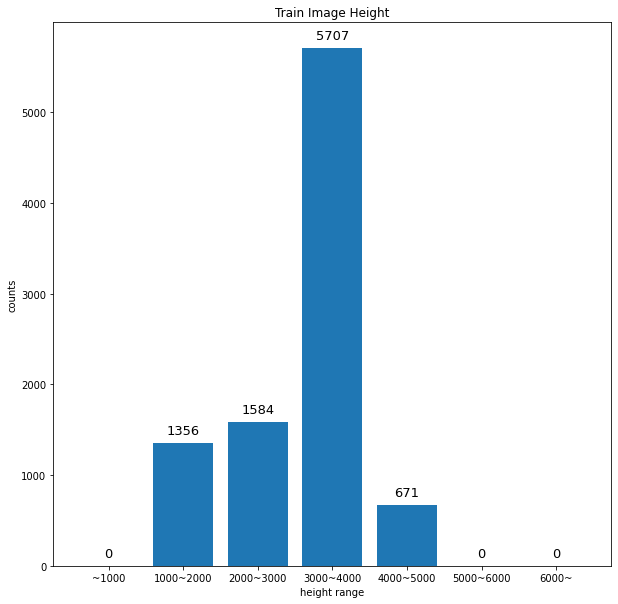

In [204]:
height_range = []
print(result['height'][result['height']<=5000].count())

hei_1 = result['height'][result['height']<=1000].count()
hei_2 = result['height'][result['height']<=2000].count() - hei_1
hei_3 = result['height'][result['height']<=3000].count() - hei_2 - hei_1
hei_4 = result['height'][result['height']<=4000].count() - hei_3 - hei_2 - hei_1
hei_5 = result['height'][result['height']<=5000].count() - hei_4 - hei_3 - hei_2 - hei_1
hei_6 = result['height'][result['height']<=6000].count() - hei_5 - hei_4 - hei_3 - hei_2 - hei_1

hei_7 = result['height'][result['height']>6000].count()
height_range = [hei_1,hei_2,hei_3,hei_4,hei_5,hei_6,hei_7]

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()

plt.title("Train Image Height")
plt.xlabel("height range")
plt.ylabel("counts")
x_bar = ["~1000","1000~2000","2000~3000","3000~4000","4000~5000","5000~6000","6000~"]
xtick_label_position = list(range(len(x_bar))) ## x축 눈금 라벨이 표시될 x좌표
plt.xticks(xtick_label_position, x_bar) ## x축 눈금 라벨 출력
 
bars = plt.bar(xtick_label_position,height_range)

for i, b in enumerate(bars):
    ax.text(b.get_x()+b.get_width()*(1/2),b.get_height()+100, \
            height_range[i],ha='center',fontsize=13)

plt.show()

## 이미지 BBOX 분포

In [206]:
result['bbox']

0       [{'xtl': 385, 'ytl': 384, 'xbr': 3747, 'ybr': ...
1       [{'xtl': 1538, 'ytl': 649, 'xbr': 3457, 'ybr':...
2       [{'xtl': 1225, 'ytl': 421, 'xbr': 3679, 'ybr':...
3       [{'xtl': 2679, 'ytl': 47, 'xbr': 3493, 'ybr': ...
4       [{'xtl': 870, 'ytl': 287, 'xbr': 4418, 'ybr': ...
                              ...                        
9313    [{'xtl': 1356, 'ytl': 534, 'xbr': 4446, 'ybr':...
9314    [{'xtl': 884, 'ytl': 465, 'xbr': 4156, 'ybr': ...
9315    [{'xtl': 1049, 'ytl': 114, 'xbr': 3260, 'ybr':...
9316    [{'xtl': 611, 'ytl': 107, 'xbr': 3139, 'ybr': ...
9317    [{'xtl': 1349, 'ytl': 486, 'xbr': 3275, 'ybr':...
Name: bbox, Length: 9318, dtype: object

In [207]:
bbox_width = []
bbox_height = []
for bbox in result['bbox']:
    bbox_wid = bbox[0]['xbr'] - bbox[0]['xtl']
    bbox_hei = bbox[0]['ybr'] - bbox[0]['ytl']
    bbox_width.append(bbox_wid)
    bbox_height.append(bbox_hei)
bbox_size = pd.DataFrame({'bbox_width':bbox_width,'bbox_height':bbox_height})
bbox_size

,bbox_width,bbox_height
0,3362,2758
1,1919,2026
2,2454,2600
3,814,1035
4,3548,2764
...,...,...
9313,3090,2403
9314,3272,2720
9315,2211,2629
9316,2528,2806


In [208]:
result2 = pd.concat([result,bbox_size],axis=1)

In [209]:
result2

,image,crop,isDisease,width,height,bbox,bbox_width,bbox_height
0,V006_79_0_00_03_03_12_0_c31_20201030_0078_S01_...,3,0,4656,3492,"[{'xtl': 385, 'ytl': 384, 'xbr': 3747, 'ybr': ...",3362,2758
1,V006_79_0_00_03_03_12_0_c32_20201117_0492_S01_...,3,0,4032,3024,"[{'xtl': 1538, 'ytl': 649, 'xbr': 3457, 'ybr':...",1919,2026
2,V006_79_0_00_03_03_12_0_c32_20201117_0487_S01_...,3,0,4032,3024,"[{'xtl': 1225, 'ytl': 421, 'xbr': 3679, 'ybr':...",2454,2600
3,V006_79_0_00_03_03_12_0_c31_20201109_0356_S01_...,3,0,4656,3492,"[{'xtl': 2679, 'ytl': 47, 'xbr': 3493, 'ybr': ...",814,1035
4,V006_79_0_00_03_03_12_0_c31_20201109_0343_S01_...,3,0,4656,3492,"[{'xtl': 870, 'ytl': 287, 'xbr': 4418, 'ybr': ...",3548,2764
...,...,...,...,...,...,...,...,...
9313,V006_79_0_00_03_03_12_0_c31_20201109_0420_S01_...,3,0,4656,3492,"[{'xtl': 1356, 'ytl': 534, 'xbr': 4446, 'ybr':...",3090,2403
9314,V006_79_0_00_03_03_12_0_c31_20201113_0149_S01_...,3,0,4656,3492,"[{'xtl': 884, 'ytl': 465, 'xbr': 4156, 'ybr': ...",3272,2720
9315,V006_79_0_00_03_03_12_0_c09_20201118_0183_S01_...,3,0,4032,3024,"[{'xtl': 1049, 'ytl': 114, 'xbr': 3260, 'ybr':...",2211,2629
9316,V006_79_0_00_03_03_12_0_c09_20201118_0196_S01_...,3,0,4032,3024,"[{'xtl': 611, 'ytl': 107, 'xbr': 3139, 'ybr': ...",2528,2806


In [210]:
bbox_df = result2[['width','height','bbox_width','bbox_height']]
#jointplot(x="imgs", y="ratio", data=dataframe, kind='scatter')
area_ratio = [(bbox_df['width']*bbox_df['height'])/(bbox_df['bbox_width']*bbox_df['bbox_height'])]
areas = []
for i in range(len(bbox_df)):
    cur = bbox_df.iloc[i]
    areas.append((cur['bbox_width']*cur['bbox_height'])/(cur['width']*cur['height']))
#areas
bbox_ratio = pd.DataFrame({'area_ratio':areas})
bbox_ratios = pd.concat([bbox_df,bbox_ratio],axis=1)
bbox_ratios

,width,height,bbox_width,bbox_height,area_ratio
0,4656,3492,3362,2758,0.570302
1,4032,3024,1919,2026,0.318869
2,4032,3024,2454,2600,0.523294
3,4656,3492,814,1035,0.051818
4,4656,3492,3548,2764,0.603163
...,...,...,...,...,...
9313,4656,3492,3090,2403,0.456694
9314,4656,3492,3272,2720,0.547388
9315,4032,3024,2211,2629,0.476735
9316,4032,3024,2528,2806,0.581785


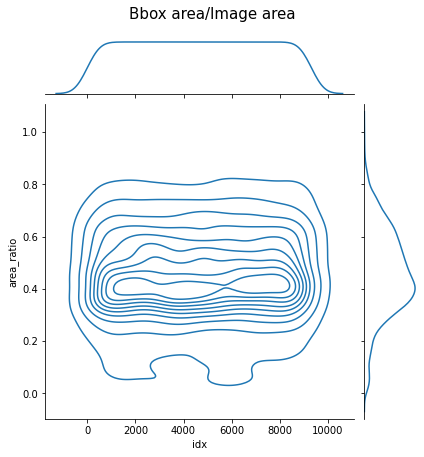

In [211]:
import seaborn as sns

print_df = bbox_ratios[['area_ratio']]
#print_df
idx = []
for i in range(len(print_df)):
    idx.append(i)
idx_df = pd.DataFrame({'idx':idx})

scat_res = pd.concat([idx_df,print_df],axis=1)

sns.jointplot(x="idx", y="area_ratio", data=scat_res, kind='kde')
plt.suptitle("Bbox area/Image area",fontsize = 15,y=1.05)
plt.show()

## Validation Set

In [171]:
image_list = pd.read_csv("/Users/somang/Desktop/mymac/boostcamp/노지 작물 질병 진단 이미지/Validation/annotation_filename.csv")
data_infos = []
#print(image_list)
root = "/Users/somang/Desktop/mymac/boostcamp/노지 작물 질병 진단 이미지/Validation/label_normal/"
img_prefix = "/Users/somang/Desktop/mymac/boostcamp/노지 작물 질병 진단 이미지/Validation/images_normal"
for file_name in image_list['0']:
    with open(root+file_name,'r') as j: #annotation 경로 추가
            dic = json.loads(j.read())

dic

{'description': {'image': 'V006_79_0_00_03_03_12_0_b07_20201022_0016_S01_1.jpg',
  'date': '2020/10/22',
  'worker': '',
  'height': 3456,
  'width': 4608,
  'task': 79,
  'type': 0,
  'region': None},
 'annotations': {'disease': 0,
  'crop': 3,
  'area': 3,
  'grow': 12,
  'risk': 0,
  'points': [{'xtl': 1398, 'ytl': 1433, 'xbr': 2373, 'ybr': 2328}]}}

In [172]:
image_list = pd.read_csv("/Users/somang/Desktop/mymac/boostcamp/노지 작물 질병 진단 이미지/Validation/annotation_filename.csv")
data_infos = []
img_annos= []
id=0
img_list = []
width_list = []
height_list = []
bbox_list = []
crop_list = []
isDiseases = []

for file_name in image_list['0']:
    with open("/Users/somang/Desktop/mymac/boostcamp/노지 작물 질병 진단 이미지/Validation/label_normal/"+file_name,'r') as j: #annotation 경로 추가
        dic = json.loads(j.read())
        date_captured = dic['description']['date']
        width = dic['description']['width']
        height = dic['description']['height']
        img_name = dic['description']['image']
        width_list.append(width)
        height_list.append(height)
        img_list.append(img_name)
        
        #print(dic)
        points = dic['annotations']['points']
        crop = dic['annotations']['crop']
        isDisease = dic['annotations']['disease']
        bbox_list.append(points)
        crop_list.append(crop)
        isDiseases.append(isDisease)
        #bboxes = [points[0]['xtl'],points[0]['ytl'],width,height]
data_list = {'image':img_list,'crop':crop_list,'isDisease':isDiseases,'width':width_list,'height':height_list,'bbox':bbox_list}
result = pd.DataFrame(data_list)
result

,image,crop,isDisease,width,height,bbox
0,V006_79_0_00_03_03_12_0_b06_20201117_0175_S01_...,3,0,4640,2196,"[{'xtl': 967, 'ytl': 190, 'xbr': 2997, 'ybr': ..."
1,V006_79_0_00_03_03_12_0_b06_20201104_0011_S01_...,3,0,4640,2196,"[{'xtl': 845, 'ytl': 102, 'xbr': 3263, 'ybr': ..."
2,V006_79_0_00_03_03_12_0_b07_20201117_0388_S01_...,3,0,3264,1836,"[{'xtl': 714, 'ytl': 30, 'xbr': 2215, 'ybr': 1..."
3,V006_79_0_00_03_03_12_0_b06_20201020_0072_S01_...,3,0,4640,2196,"[{'xtl': 1141, 'ytl': 10, 'xbr': 3351, 'ybr': ..."
4,V006_79_0_00_03_03_12_0_c31_20201109_0086_S01_...,3,0,4656,3492,"[{'xtl': 428, 'ytl': 1126, 'xbr': 3856, 'ybr':..."
...,...,...,...,...,...,...
1178,V006_79_0_00_03_03_11_0_c28_20201204_0006_S01_...,3,0,1816,4032,"[{'xtl': 119, 'ytl': 1266, 'xbr': 1107, 'ybr':..."
1179,V006_79_0_00_03_03_12_0_c32_20201117_0984_S01_...,3,0,4032,3024,"[{'xtl': 1499, 'ytl': 635, 'xbr': 3602, 'ybr':..."
1180,V006_79_0_00_03_03_12_0_c31_20201030_0147_S01_...,3,0,4656,3492,"[{'xtl': 1075, 'ytl': 403, 'xbr': 4224, 'ybr':..."
1181,V006_79_0_00_03_03_12_0_b06_20201020_0158_S01_...,3,0,4640,2196,"[{'xtl': 1036, 'ytl': 112, 'xbr': 3152, 'ybr':..."


In [173]:
#원본이미지 개수
img_len = len(image_list['0'])
print("image 개수 :",img_len)
#dataframe 행 개수와 원본이미지 개수 동일한지 파악
if img_len == len(result):
    print("이미지 한 개당 annotation file 한 개 존재")

#crop이 3인 데이터의 개수 (작물이 배추인 데이터의 개수)
if img_len == len(result['crop']==3):
    print("모든 데이터는 배추")

#모두 정상데이터인지 확인
if img_len == len(result['isDisease']==0):
    print("모든 데이터는 정상 작물 표기")

image 개수 : 1183
이미지 한 개당 annotation file 한 개 존재
모든 데이터는 배추
모든 데이터는 정상 작물 표기


In [174]:
result.describe()

,crop,isDisease,width,height
count,1183.0,1183.0,1183.000000,1183.000000
mean,3.0,0.0,4070.157227,2884.192730
std,0.0,0.0,658.073751,677.087045
min,3.0,0.0,1468.000000,1836.000000
25%,3.0,0.0,4032.000000,2196.000000
50%,3.0,0.0,4032.000000,3024.000000
75%,3.0,0.0,4640.000000,3492.000000
max,3.0,0.0,6000.000000,4160.000000


In [175]:
isone = False
for box in result['bbox']:
    if len(box)!= 1:
        isone = False
        break
    else:
        isone = True
        pass
if isone == True:
    print("모든 이미지는 하나의 bbox를 가집니다.")
else:
    print("모든 이미지가 하나의 bbox만 가지는 것은 아닙니다.")

모든 이미지는 하나의 bbox를 가집니다.


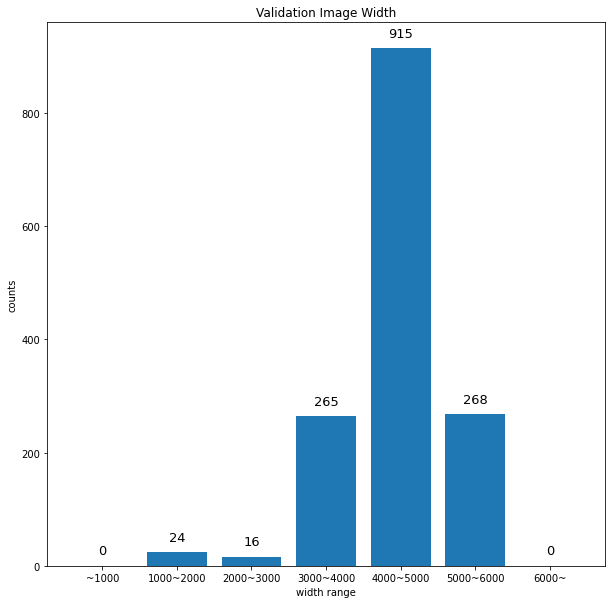

In [176]:
import matplotlib.pyplot as plt

width_range = []
wid_1 = result['width'][result['width']<=1000].count()
wid_2 = result['width'][result['width']<=2000].count() - wid_1
wid_3 = result['width'][result['width']<=3000].count() - wid_2
wid_4 = result['width'][result['width']<=4000].count() - wid_3
wid_5 = result['width'][result['width']<=5000].count() - wid_4
wid_6 = result['width'][result['width']<=6000].count() - wid_5
wid_7 = result['width'][result['width']>6000].count()
width_range = [wid_1,wid_2,wid_3,wid_4,wid_5,wid_6,wid_7]
width_range

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()

plt.title("Validation Image Width")
plt.xlabel("width range")
plt.ylabel("counts")
x_bar = ["~1000","1000~2000","2000~3000","3000~4000","4000~5000","5000~6000","6000~"]
xtick_label_position = list(range(len(x_bar))) ## x축 눈금 라벨이 표시될 x좌표
plt.xticks(xtick_label_position, x_bar) ## x축 눈금 라벨 출력
 
bars = plt.bar(xtick_label_position,width_range)

for i, b in enumerate(bars):
    ax.text(b.get_x()+b.get_width()*(1/2),b.get_height()+20, \
            width_range[i],ha='center',fontsize=13)

plt.show()

In [177]:
result['bbox']

0       [{'xtl': 967, 'ytl': 190, 'xbr': 2997, 'ybr': ...
1       [{'xtl': 845, 'ytl': 102, 'xbr': 3263, 'ybr': ...
2       [{'xtl': 714, 'ytl': 30, 'xbr': 2215, 'ybr': 1...
3       [{'xtl': 1141, 'ytl': 10, 'xbr': 3351, 'ybr': ...
4       [{'xtl': 428, 'ytl': 1126, 'xbr': 3856, 'ybr':...
                              ...                        
1178    [{'xtl': 119, 'ytl': 1266, 'xbr': 1107, 'ybr':...
1179    [{'xtl': 1499, 'ytl': 635, 'xbr': 3602, 'ybr':...
1180    [{'xtl': 1075, 'ytl': 403, 'xbr': 4224, 'ybr':...
1181    [{'xtl': 1036, 'ytl': 112, 'xbr': 3152, 'ybr':...
1182    [{'xtl': 1398, 'ytl': 1433, 'xbr': 2373, 'ybr'...
Name: bbox, Length: 1183, dtype: object

In [178]:
bbox_width = []
bbox_height = []
for bbox in result['bbox']:
    bbox_wid = bbox[0]['xbr'] - bbox[0]['xtl']
    bbox_hei = bbox[0]['ybr'] - bbox[0]['ytl']
    bbox_width.append(bbox_wid)
    bbox_height.append(bbox_hei)
bbox_size = pd.DataFrame({'bbox_width':bbox_width,'bbox_height':bbox_height})
bbox_size

,bbox_width,bbox_height
0,2030,1976
1,2418,2094
2,1501,1806
3,2210,2131
4,3428,2152
...,...,...
1178,988,1127
1179,2103,2351
1180,3149,2727
1181,2116,2084


In [179]:
result2 = pd.concat([result,bbox_size],axis=1)
result2

,image,crop,isDisease,width,height,bbox,bbox_width,bbox_height
0,V006_79_0_00_03_03_12_0_b06_20201117_0175_S01_...,3,0,4640,2196,"[{'xtl': 967, 'ytl': 190, 'xbr': 2997, 'ybr': ...",2030,1976
1,V006_79_0_00_03_03_12_0_b06_20201104_0011_S01_...,3,0,4640,2196,"[{'xtl': 845, 'ytl': 102, 'xbr': 3263, 'ybr': ...",2418,2094
2,V006_79_0_00_03_03_12_0_b07_20201117_0388_S01_...,3,0,3264,1836,"[{'xtl': 714, 'ytl': 30, 'xbr': 2215, 'ybr': 1...",1501,1806
3,V006_79_0_00_03_03_12_0_b06_20201020_0072_S01_...,3,0,4640,2196,"[{'xtl': 1141, 'ytl': 10, 'xbr': 3351, 'ybr': ...",2210,2131
4,V006_79_0_00_03_03_12_0_c31_20201109_0086_S01_...,3,0,4656,3492,"[{'xtl': 428, 'ytl': 1126, 'xbr': 3856, 'ybr':...",3428,2152
...,...,...,...,...,...,...,...,...
1178,V006_79_0_00_03_03_11_0_c28_20201204_0006_S01_...,3,0,1816,4032,"[{'xtl': 119, 'ytl': 1266, 'xbr': 1107, 'ybr':...",988,1127
1179,V006_79_0_00_03_03_12_0_c32_20201117_0984_S01_...,3,0,4032,3024,"[{'xtl': 1499, 'ytl': 635, 'xbr': 3602, 'ybr':...",2103,2351
1180,V006_79_0_00_03_03_12_0_c31_20201030_0147_S01_...,3,0,4656,3492,"[{'xtl': 1075, 'ytl': 403, 'xbr': 4224, 'ybr':...",3149,2727
1181,V006_79_0_00_03_03_12_0_b06_20201020_0158_S01_...,3,0,4640,2196,"[{'xtl': 1036, 'ytl': 112, 'xbr': 3152, 'ybr':...",2116,2084


In [180]:
bbox_df = result2[['width','height','bbox_width','bbox_height']]
#jointplot(x="imgs", y="ratio", data=dataframe, kind='scatter')
area_ratio = [(bbox_df['width']*bbox_df['height'])/(bbox_df['bbox_width']*bbox_df['bbox_height'])]
areas = []
for i in range(len(bbox_df)):
    cur = bbox_df.iloc[i]
    areas.append((cur['bbox_width']*cur['bbox_height'])/(cur['width']*cur['height']))
#areas
bbox_ratio = pd.DataFrame({'area_ratio':areas})
bbox_ratios = pd.concat([bbox_df,bbox_ratio],axis=1)
bbox_ratios

,width,height,bbox_width,bbox_height,area_ratio
0,4640,2196,2030,1976,0.393670
1,4640,2196,2418,2094,0.496916
2,3264,1836,1501,1806,0.452351
3,4640,2196,2210,2131,0.462195
4,4656,3492,3428,2152,0.453728
...,...,...,...,...,...
1178,1816,4032,988,1127,0.152070
1179,4032,3024,2103,2351,0.405499
1180,4656,3492,3149,2727,0.528166
1181,4640,2196,2116,2084,0.432776


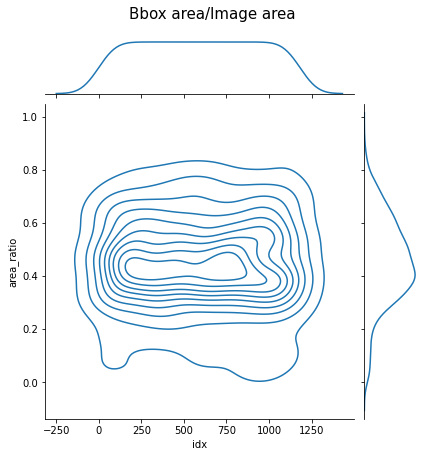

In [181]:
import seaborn as sns

print_df = bbox_ratios[['area_ratio']]
#print_df
idx = []
for i in range(len(print_df)):
    idx.append(i)
idx_df = pd.DataFrame({'idx':idx})

scat_res = pd.concat([idx_df,print_df],axis=1)

sns.jointplot(x="idx", y="area_ratio", data=scat_res, kind='kde')
plt.suptitle("Bbox area/Image area",fontsize = 15,y=1.05)
plt.show()